In [1]:
from shared_notebook_utils import *
from scipy.stats import gaussian_kde
seaborn.set(style="whitegrid")
%matplotlib inline
datasets = load_datasets(dirnames=None, clean=True)
METHOD = 'Percival14_bpm'

/usr/local/lib/python2.7/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


# Error analysis


Wrongly predicted sounds from FSL4
----------------------------------

Selected sound id: 903
/Users/ffont/Data/AudioCommons/freesound_loops_db_4000/audio/wav/903.wav
Confidence: 0.97
Estimated BPM: 128, 128.40 (gt: 190)


Selected sound id: 43184
/Users/ffont/Data/AudioCommons/freesound_loops_db_4000/audio/wav/43184.wav
Confidence: 0.01
Estimated BPM: 90, 89.88 (gt: 180)


Selected sound id: 146169
/Users/ffont/Data/AudioCommons/freesound_loops_db_4000/audio/wav/146169.wav
Confidence: 1.00
Estimated BPM: 80, 80.12 (gt: 160)


Selected sound id: 220912
/Users/ffont/Data/AudioCommons/freesound_loops_db_4000/audio/wav/220912.wav
Confidence: 0.95
Estimated BPM: 90, 89.88 (gt: 120)


Selected sound id: 102473
/Users/ffont/Data/AudioCommons/freesound_loops_db_4000/audio/wav/102473.wav
Confidence: 0.94
Estimated BPM: 129, 129.20 (gt: 130)



Wrongly predicted sounds from APPL
----------------------------------

Selected sound id: 27391e6a1afc01b83ceb46d89d20b437
/Users/ffont/Data/AudioCommons/apple_loops_db/audio/wav/Contortion Bass.caf.wav
Confidence: 0.44
Estimated BPM: 130, 130.01 (gt: 128)


Selected sound id: 906410dfc3fedccc3f87a3353288a9e0
/Users/ffont/Data/AudioCommons/apple_loops_db/audio/wav/Hollow Analog Sub Bass.caf.wav
Confidence: 0.65
Estimated BPM: 77, 77.13 (gt: 120)


Selected sound id: 08128b7e5bca70d7b203a0e5a4a3360f
/Users/ffont/Data/AudioCommons/apple_loops_db/audio/wav/Golden Hour String.caf.wav
Confidence: 0.37
Estimated BPM: 133, 132.51 (gt: 80)


Selected sound id: 369b59c1b0a40688e1552fd9de666027
/Users/ffont/Data/AudioCommons/apple_loops_db/audio/wav/Abandoned Orchestral Layers.caf.wav
Confidence: 0.93
Estimated BPM: 134, 134.23 (gt: 67)


Selected sound id: e0ce7526e9b407e8e90c1f5432721be8
/Users/ffont/Data/AudioCommons/apple_loops_db/audio/wav/Brooklyn Nights Synth.caf.wav
Confidence: 0.77
Estimated BPM: 139, 138.74 (gt: 100)



Wrongly predicted sounds from MIXL
----------------------------------

Selected sound id: 9152
/Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/9152.wav
Confidence: 0.27
Estimated BPM: 110, 109.96 (gt: 95)


Selected sound id: 1237
/Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/1237.wav
Confidence: 1.00
Estimated BPM: 114, 113.89 (gt: 57)


Selected sound id: 12296
/Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/12296.wav
Confidence: 0.85
Estimated BPM: 87, 86.86 (gt: 100)


Selected sound id: 8207
/Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/8207.wav
Confidence: 0.91
Estimated BPM: 128, 128.40 (gt: 127)


Selected sound id: 5399
/Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/5399.wav
Confidence: 0.85
Estimated BPM: 96, 95.70 (gt: 95)



Wrongly predicted sounds from LOOP
----------------------------------

Selected sound id: 2f4d8998adaa9b6a80eca966fd8fadc3
/Users/ffont/Data/AudioCommons/looperman/audio/wav/6810_looperman_39029_6810_rei_met05_E_120.wav
Confidence: 0.43
Estimated BPM: 119, 119.49 (gt: 120)


Selected sound id: 5ff9c6b90347ab80f072d7f65b11f08d
/Users/ffont/Data/AudioCommons/looperman/audio/wav/23679_looperman_229129_23679_E_Piano_Riff_2_120_bpm.wav
Confidence: 0.66
Estimated BPM: 61, 61.16 (gt: 120)


Selected sound id: c19fb7623eb374d89b6e48a4c7bf6f75
/Users/ffont/Data/AudioCommons/looperman/audio/wav/17265_looperman_194072_17265_.wav
Confidence: 0.85
Estimated BPM: 120, 120.19 (gt: 128)


Selected sound id: f225eda651f48deea4906cac5cec4779
/Users/ffont/Data/AudioCommons/looperman/audio/wav/30649_looperman_299644_30649_Frenchcore_Kick_2.wav
Confidence: 0.36
Estimated BPM: 114, 113.58 (gt: 230)


Selected sound id: d25ab214c5c57b04f133c2caf68b7326
/Users/ffont/Data/AudioCommons/looperman/audio/wav/18194_looperman_243518_18194_Pluck_Perc_01.wav
Confidence: 1.00
Estimated BPM: 99, 98.91 (gt: 132)


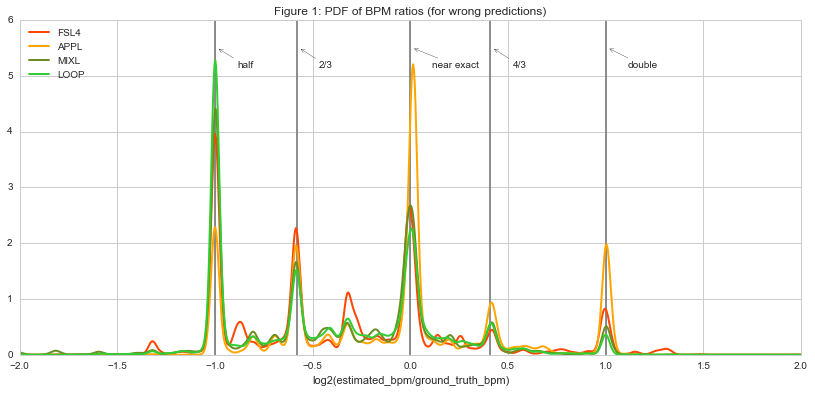

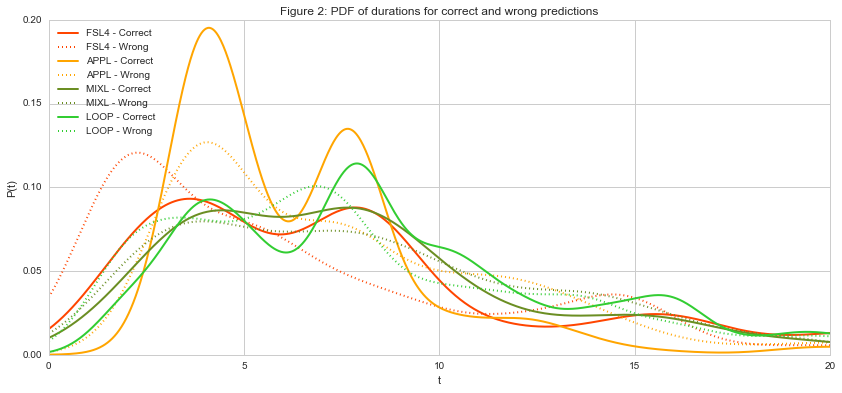

In [2]:
fig1, ax1 = plt.subplots(1, 1, figsize=(14, 6))  # Figure and axis for PDF ratio plot
fig2, ax2 = plt.subplots(1, 1, figsize=(14, 6))  # Figure and axis for duration distribution of sounds

def condition_good_prediction(key, item, data):
    result = metric_close_bpm(data, METHOD, tolerance=0, sound_ids=[key])
    if len(result) > 0 and result[0] == 1:
        return True
    else:
        return False
    
def condition_bad_prediction(key, item, data):
    result = metric_close_bpm(data, METHOD, tolerance=0, sound_ids=[key])
    if len(result) > 0 and result[0] == 0:
        return True
    else:
        return False

for count, dataset in enumerate(datasets):
    # Select bad results from dataset and according to method and compute PDF using KDE (https://jakevdp.github.io/blog/2013/12/01/kernel-density-estimation/)
    correctly_predicted = dataset.filter_data(condition=condition_good_prediction)  
    wrongly_predicted = dataset.filter_data(condition=condition_bad_prediction)
    
    # Compute bpm ratio
    bpm_ratios = [(float(item['analysis'][METHOD]['bpm'])/item['annotations']['bpm']) for key, item in wrongly_predicted.data.items()]
    bpm_ratios = [math.log(x, 2) for x in bpm_ratios]
    bpm_ratios = np.array(bpm_ratios)
    kde = gaussian_kde(bpm_ratios, bw_method=0.02 / bpm_ratios.std(ddof=1))
    x_grid = np.linspace(-2.0, 2.0, 1000)
    x = kde.evaluate(x_grid)
    ax1.plot(x_grid, x, color=COLORS[count], linewidth=2.0, label=dataset.short_name)
    
    # Compute duration
    lss = {'Correct': '-', 'Wrong': ':'}
    for label, data_subset in [('Correct', correctly_predicted), ('Wrong', wrongly_predicted)]:
        durations = data_subset.get_data('analysis.basic_audio_properties.duration') 
        durations = np.array(durations)
        kde = gaussian_kde(durations)
        x_grid = np.linspace(0.0, 20.0, 1000)
        x = kde.evaluate(x_grid)
        ax2.plot(x_grid, x, color=COLORS[count], linewidth=2.0, label="%s - %s" % (dataset.short_name, label), ls=lss[label])
        
    # Select some sounds which have not been correctly predicted with different confidence measures
    print title('Wrongly predicted sounds from %s' % dataset.short_name)
    for item in random.sample(wrongly_predicted.data.values(), 5):
        sound_file_path = os.path.join(dataset.dataset_path, item['wav_sound_path'])
        print 'Selected sound id: %s' % item['id']
        print sound_file_path
        print 'Confidence: %.2f' % confidence_measure_audio_length(
            item['analysis'][METHOD]['bpm'],  
            item['analysis']['basic_audio_properties']['length_samples'], 
            item['analysis']['basic_audio_properties']['length_samples_effective_duration'])
        print 'Estimated BPM: %i, %.2f (gt: %i)' % (item['analysis'][METHOD]['bpm'], item['analysis'][METHOD]['bpm_raw'], item['annotations']['bpm'])
        IPython.display.display(IPython.display.Audio(sound_file_path))
    
ax1.set_title('Figure 1: PDF of BPM ratios (for wrong predictions)')
ax1.set_xlabel('log2(estimated_bpm/ground_truth_bpm)')
ax1.legend(loc=2)
for peak_position, label in [(-1.0,'half'), (-0.58,'2/3'), (0.0,'near exact'), (0.41,'4/3'), (1.0,'double')]:
    # Annotate meaning of peak positions
    ax1.vlines(peak_position, 0, 6, label='tick', color='gray')
    ax1.annotate(label, xy=(peak_position + 0.01,5.5), xycoords='data',
                 xytext=(20, -20), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->"))
    
ax2.set_title('Figure 2: PDF of durations for correct and wrong predictions')
ax2.set_xlabel('t')
ax2.set_ylabel('P(t)')
ax2.legend(loc=2)

In Fig. 1 we show the probability density function of the ratios between the estimated BPM and the ground truth BPM values (only for the case of sounds whose BPM was wrongly predicted). This gives us some insight about typical prediction errors. We observe a very high peak at 0.5, meaning that the prediction is half the ground truth tempo (half octave error), and we observer another relevant peak at 2.0 (double tempo, octave error again). Another relevant peak is at 2/3 and 3/4 of the original tempo (meaning ternary relation with the original). Finally, the strong peak at 1.0 indicates that in a number of cases both the estimated values and the ground truth values are very similar, although not exactly the same. Results are rounded to integer values, which means that the deviations with a ratio close to 1.0 mean small BPM differences of 1 or 2 BPM. Another general conclusion that can be drawn from lookit at Fig. 1 i s that estimated tempos tend to be slower than the ground truth, as the energy of the histogram is mostly concentrated below the 1.0 ratio.

NOTE: 4/3 -> take the dotted quarter-note instead of the half-note (detencted tempo is faster)
NOTE: 2/3 -> take the dotted quarter-note instead of the quarter-note (detected tempo is slower)

In Fig. 2 we show the distribution of the durations of sounds in different dataets and for those being correctly and wrongly predicted. We see no strong correlation between the different cases.